In [1]:
%matplotlib inline

In [2]:
import pylab as pl
import numpy as np
import rtpipe
import rtlib_cython as rtlib
from scipy.io import wavfile
from IPython.display import Audio

2016-10-14 17:04:36,042 - py.warnings - WARNING - /users/claw/miniconda/envs/development/lib/python2.7/site-packages/matplotlib/__init__.py:1357: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)



In [3]:
def getsgram(ddcut, cut, scan, gainfile, segments, show=False, **kwargs):
    st = rtpipe.RT.set_pipeline(ddcut, scan, dmarr=[0], dtarr=[1], flaglist=[], flagantsol=True,
                                uvoversample=1.5, gainfile=gainfile, logfile=False, **kwargs)
    im, data = rtpipe.RT.pipeline_reproduce(st, candloc=[0,0,0,0,0], product='imdata')
    l1, m1 = rtpipe.RT.calc_lm(st, im, minmax='max')

    st_seg = rtpipe.RT.set_pipeline(cut, scan, dmarr=[0], dtarr=[1], flaglist=[('badap', 3., 0.2)], 
                                    uvoversample=1.5, gainfile=gainfile, flagantsol=True, timesub='mean', 
                                    logfile=False, **kwargs)

    sh = (st_seg['nchan'], len(segments)*st_seg['readints'])
    sgram = np.zeros(shape=sh, dtype='float32')
    for segment in segments:
        data_seg = rtpipe.RT.pipeline_reproduce(st_seg, segment=segment, product='data')
        u, v, w = rtpipe.parsesdm.get_uvw_segment(st_seg, segment)
        rtlib.phaseshift_threaded(data_seg, st_seg, l1, m1, u, v)
        sgram[:, (segment-min(segments))*st_seg['readints']:((segment-min(segments))+1)*st_seg['readints']] = data_seg.mean(axis=3).mean(axis=1).real.transpose()

    if show:
        pl.figure(figsize=(12,5))
        pl.imshow(sgram, interpolation='nearest', cmap='viridis', origin='bottom')
        pl.colorbar()
        pl.show()
    return sgram

def writesound(sgram, mp3name, show=True):
    T = len(sgram[0])
    n = len(sgram)*2
    sgram_fft = np.fft.irfft(sgram, n=n, axis=0).real[:n/2]

    if show:
        pl.figure(figsize=(15,8))
        pl.subplot(211)
        pl.imshow(sgram, interpolation='nearest', cmap='viridis', origin='bottom', vmax=sgram.max()/2)
        pl.colorbar()
        pl.subplot(212)
        pl.imshow(sgram_fft, origin='bottom', cmap='viridis', vmax=sgram_fft.max()/2)
        pl.colorbar()
        
    # line up ffts in time
    sound = sgram_fft.reshape(n/2*T, order='F')
    print('Original sound min/max: {0}/{1}'.format(sound.min(), sound.max()))

    # scale to data range to int16 range
    sound = np.int16((sound-sound.min()) * 2**16/(sound.max()-sound.min()) - 32767)  
    print('Rescaled sound min/max: {0}/{1}'.format(sound.min(), sound.max()))
    
    fs = n/2*200
    wavfile.write(mp3name, int(fs), sound)

## 57623

In [4]:
sgram = getsgram('16A-459_TEST_1hr.57623.72670021991.ddcut', '16A-459_TEST_1hr.57623.72670021991.cut', 6,
                '16A-459_TEST_1hr.57623.72670021991.GN', [1,2], npix_max=4096)#, spw=[0,1,2,3,5,7])

2016-10-14 17:04:36,987 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-14 17:04:36,987 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-459_TEST_1hr.57623.72670021991.GN
2016-10-14 17:04:36,988 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-14 17:04:36,988 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-14 17:04:36,989 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to []
2016-10-14 17:04:36,989 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-14 17:04:36,990 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-14 17:04:36,990 - rtpipe.parsesdm - INFO - Setting (standard) key uvoversample to 1.5
2016-10-14 17:04:37,102 - rtpipe.parsesdm - WARNING - No BDF found for scans [1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14]
2016-10-14 17:04:37,342 - rtpipe.parsesdm - WARNING - No BDF found for scans [1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14]


Gridded 1.000 of data. Scaling fft by = 50.8
Pixel sizes (1.5", 1.1"), Field size 1983.3"


2016-10-14 17:04:39,816 - rtpipe - INFO - Made image with SNR min, max: -5.3, 37.3
2016-10-14 17:04:39,871 - rtpipe - INFO - Rephasing data to (l, m)=(-0.0004, 0.0005).
2016-10-14 17:04:39,939 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-14 17:04:39,939 - rtpipe.parsesdm - INFO - Setting (standard) key timesub to mean
2016-10-14 17:04:39,940 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-459_TEST_1hr.57623.72670021991.GN
2016-10-14 17:04:39,940 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-14 17:04:39,941 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-14 17:04:39,941 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to [('badap', 3.0, 0.2)]
2016-10-14 17:04:39,942 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-14 17:04:39,943 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-14 17:04:39,943 - rtpipe.parsesdm - INFO - Setting (

Original sound min/max: -0.00620393901956/0.0053666530739
Rescaled sound min/max: -32767/30974


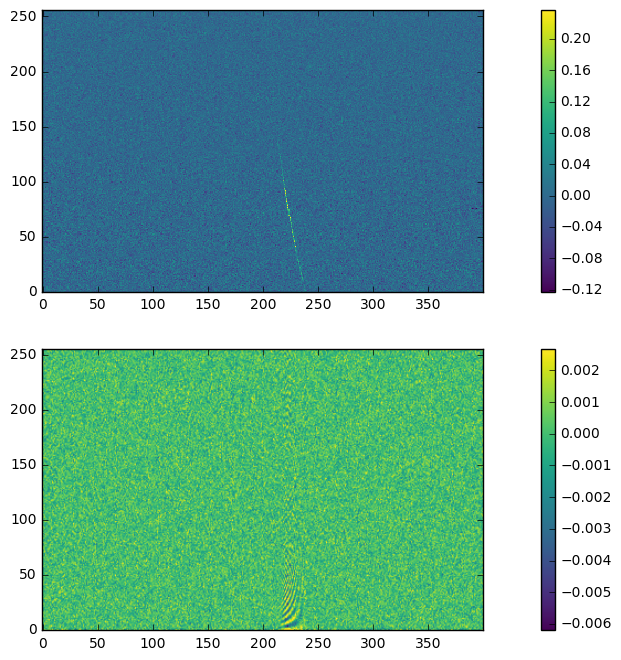

In [5]:
writesound(sgram, '57623.mp3', show=True)
Audio('57623.mp3')

## 57633 scan 7

In [6]:
# burst cut for 3 ints
# bdf_dedisperse_cut.py -i 7:9514:3 -d 557.0 -e scan7.ddcut 16A-459_TEST_1hr_000.57633.66130137732
# cut from -400 ints to +400 ints from start of event. no dedispersion
# bdf_dedisperse_cut.py -i 7:9114:800 -e scan7.cut 16A-459_TEST_1hr_000.57633.66130137732

sgram = getsgram('16A-459_TEST_1hr_000.57633.66130137732.scan7.ddcut', 
                 '16A-459_TEST_1hr_000.57633.66130137732.scan7.cut', 7, 
                 '16A-459_TEST_1hr_000.57633.66130137732.GN', [1,2], npix_max=4096)

2016-10-14 17:05:07,332 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-14 17:05:07,332 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-459_TEST_1hr_000.57633.66130137732.GN
2016-10-14 17:05:07,333 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-14 17:05:07,333 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-14 17:05:07,334 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to []
2016-10-14 17:05:07,334 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-14 17:05:07,335 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-14 17:05:07,335 - rtpipe.parsesdm - INFO - Setting (standard) key uvoversample to 1.5
2016-10-14 17:05:07,426 - rtpipe.parsesdm - WARNING - No BDF found for scans [1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14]
2016-10-14 17:05:07,687 - rtpipe.parsesdm - WARNING - No BDF found for scans [1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 

Gridded 1.000 of data. Scaling fft by = 56.1
Pixel sizes (1.4", 1.1"), Field size 1983.3"


2016-10-14 17:05:10,450 - rtpipe - INFO - Made image with SNR min, max: -5.4, 118.6
2016-10-14 17:05:10,505 - rtpipe - INFO - Rephasing data to (l, m)=(-0.0004, 0.0005).
2016-10-14 17:05:10,582 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-14 17:05:10,583 - rtpipe.parsesdm - INFO - Setting (standard) key timesub to mean
2016-10-14 17:05:10,583 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-459_TEST_1hr_000.57633.66130137732.GN
2016-10-14 17:05:10,584 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-14 17:05:10,585 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-14 17:05:10,585 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to [('badap', 3.0, 0.2)]
2016-10-14 17:05:10,586 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-14 17:05:10,587 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-14 17:05:10,587 - rtpipe.parsesdm - INFO - Sett

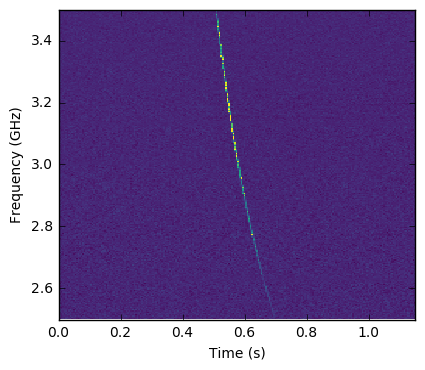

In [24]:
pl.imshow(sgram[:,100:330], interpolation='nearest', cmap='viridis', origin='bottom', vmax=sgram.max()*0.3,
         extent=[0, 230*0.005, 2.5, 3.5])
pl.xlabel('Time (s)')
pl.ylabel('Frequency (GHz)')

Original sound min/max: -0.0289877142774/0.0305712737724
Rescaled sound min/max: -32767/32418


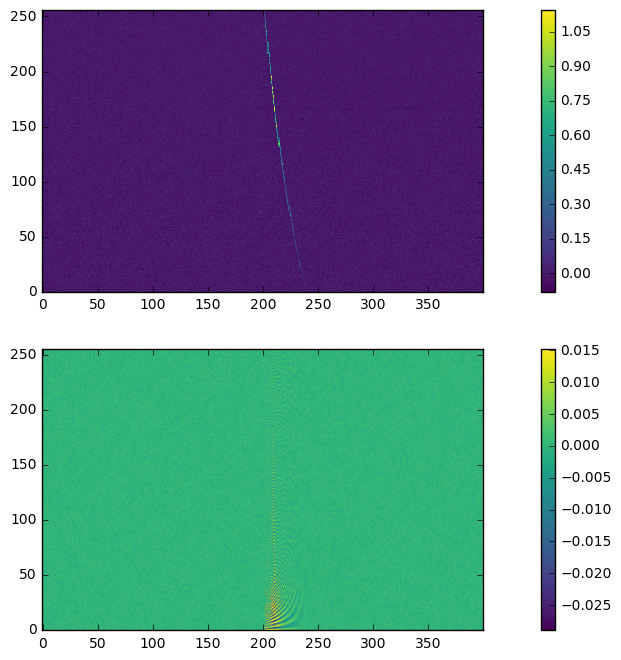

In [7]:
writesound(sgram, '57633.scan7.mp3', show=True)
Audio('57633.scan7.mp3')

## 57633 scan 13

In [8]:
# bdf_dedisperse_cut.py -i 13:10144:800 -d 0.0 -e scan13.cut 16A-459_TEST_1hr_000.57633.66130137732
sgram = getsgram('16A-459_TEST_1hr_000.57633.66130137732.scan13.ddcut', 
                 '16A-459_TEST_1hr_000.57633.66130137732.scan13.cut', 13, 
                 '16A-459_TEST_1hr_000.57633.66130137732.GN', [1,2], npix_max=4096)

2016-10-04 15:18:29,408 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:18:29,409 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-459_TEST_1hr_000.57633.66130137732.GN
2016-10-04 15:18:29,410 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:18:29,410 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:18:29,411 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to []
2016-10-04 15:18:29,411 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-04 15:18:29,412 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-04 15:18:29,412 - rtpipe.parsesdm - INFO - Setting (standard) key uvoversample to 1.5
2016-10-04 15:18:29,720 - rtpipe.parsesdm - WARNING - No BDF found for scans [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14]
2016-10-04 15:18:29,956 - rtpipe.parsesdm - WARNING - No BDF found for scans [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14

Gridded 1.000 of data. Scaling fft by = 49.9
Pixel sizes (1.5", 1.1"), Field size 1983.3"


2016-10-04 15:18:47,142 - rtpipe - INFO - Made image with SNR min, max: -5.0, 12.1
2016-10-04 15:18:47,182 - rtpipe - INFO - Rephasing data to (l, m)=(-0.0004, 0.0005).
2016-10-04 15:18:47,233 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:18:47,233 - rtpipe.parsesdm - INFO - Setting (standard) key timesub to mean
2016-10-04 15:18:47,234 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-459_TEST_1hr_000.57633.66130137732.GN
2016-10-04 15:18:47,235 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:18:47,235 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:18:47,236 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to [('badap', 3.0, 0.2)]
2016-10-04 15:18:47,236 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-04 15:18:47,237 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-04 15:18:47,237 - rtpipe.parsesdm - INFO - Setti

Original sound min/max: -0.003260810866/0.00359176932443
Rescaled sound min/max: -32767/30915


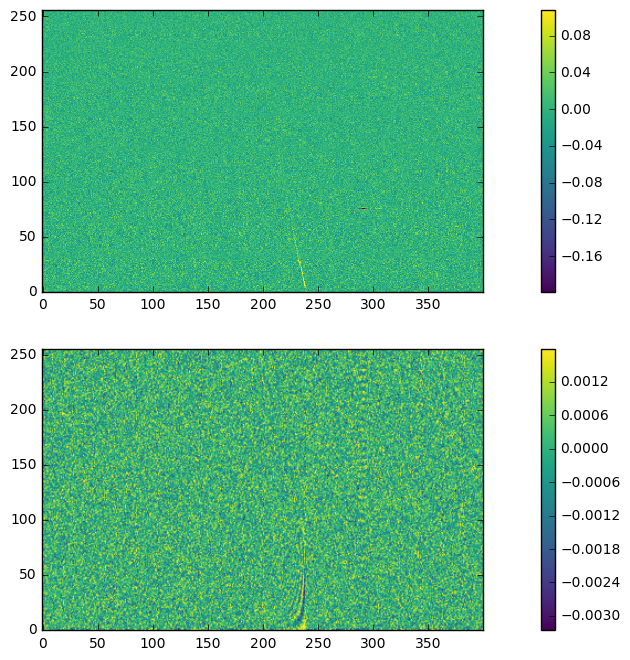

In [9]:
writesound(sgram, '57633.scan13.mp3', show=True)
Audio('57633.scan13.mp3')

## 57638

In [10]:
# bdf_dedisperse_cut.py -i 29:18298:800 -e cut 16A-496_sb32698778_1_02h00m.57638.42695471065
sgram = getsgram('16A-496_sb32698778_1_02h00m.57638.42695471065.ddcut',
                 '16A-496_sb32698778_1_02h00m.57638.42695471065.cut', 29, 
                 '16A-496_sb32698778_1_02h00m.57638.42695471065.GN', [1,2], npix_max=4096)

2016-10-04 15:19:15,004 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:19:15,004 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-496_sb32698778_1_02h00m.57638.42695471065.GN
2016-10-04 15:19:15,005 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:19:15,005 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:19:15,006 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to []
2016-10-04 15:19:15,006 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-04 15:19:15,007 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-04 15:19:15,007 - rtpipe.parsesdm - INFO - Setting (standard) key uvoversample to 1.5
2016-10-04 15:19:15,222 - rtpipe.parsesdm - WARNING - No BDF found for scans [4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 22, 23, 24, 25, 26, 28, 30, 31, 32]
2016-10-04 15:19:15,698 - rtpipe.parsesdm - WARNING - No BDF fou

Gridded 0.982 of data. Scaling fft by = 86.6
Pixel sizes (1.1", 1.0"), Field size 1983.3"


2016-10-04 15:19:36,896 - rtpipe - INFO - Made image with SNR min, max: -5.6, 10.9
2016-10-04 15:19:36,956 - rtpipe - INFO - Rephasing data to (l, m)=(-0.0004, 0.0005).
2016-10-04 15:19:37,036 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:19:37,037 - rtpipe.parsesdm - INFO - Setting (standard) key timesub to mean
2016-10-04 15:19:37,037 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-496_sb32698778_1_02h00m.57638.42695471065.GN
2016-10-04 15:19:37,038 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:19:37,038 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:19:37,039 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to [('badap', 3.0, 0.2)]
2016-10-04 15:19:37,039 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-04 15:19:37,040 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-04 15:19:37,041 - rtpipe.parsesdm - INFO 

Original sound min/max: -0.00355151823872/0.00352603639616
Rescaled sound min/max: -32767/31565


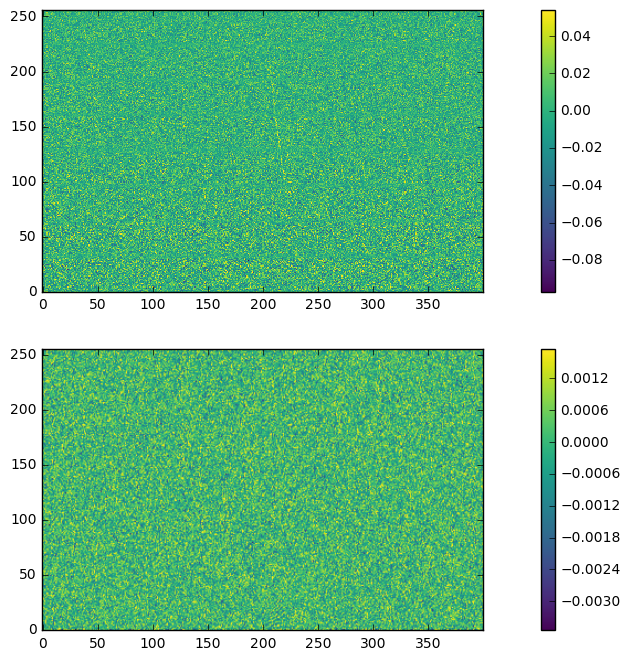

In [11]:
mp3name = '57638.mp3'
writesound(sgram, mp3name, show=True)
Audio(mp3name)

## 57643

In [12]:
sgram = getsgram('16A-496_sb32698778_1_02h00m_001.57643.38562630787.ddcut',
                 '16A-496_sb32698778_1_02h00m_001.57643.38562630787.cut', 29, 
                 '16A-496_sb32698778_1_02h00m_001.57643.38562630787.GN', [1,2], npix_max=4096)

2016-10-04 15:20:07,005 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:20:07,006 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-496_sb32698778_1_02h00m_001.57643.38562630787.GN
2016-10-04 15:20:07,006 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:20:07,007 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:20:07,007 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to []
2016-10-04 15:20:07,008 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-04 15:20:07,008 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-04 15:20:07,009 - rtpipe.parsesdm - INFO - Setting (standard) key uvoversample to 1.5
2016-10-04 15:20:07,153 - rtpipe.parsesdm - WARNING - No BDF found for scans [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 32, 33]
2016-10-04 15:20:07,550 - rtpipe

Gridded 0.985 of data. Scaling fft by = 117.5
Pixel sizes (1.0", 1.0"), Field size 1983.3"


2016-10-04 15:20:26,972 - rtpipe - INFO - Made image with SNR min, max: -5.1, 73.7
2016-10-04 15:20:27,043 - rtpipe - INFO - Rephasing data to (l, m)=(-0.0004, 0.0005).
2016-10-04 15:20:27,137 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:20:27,138 - rtpipe.parsesdm - INFO - Setting (standard) key timesub to mean
2016-10-04 15:20:27,138 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-496_sb32698778_1_02h00m_001.57643.38562630787.GN
2016-10-04 15:20:27,139 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:20:27,140 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:20:27,140 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to [('badap', 3.0, 0.2)]
2016-10-04 15:20:27,141 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-04 15:20:27,141 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-04 15:20:27,142 - rtpipe.parsesdm - I

Original sound min/max: -0.00928471521626/0.00876687520613
Rescaled sound min/max: -32767/31558


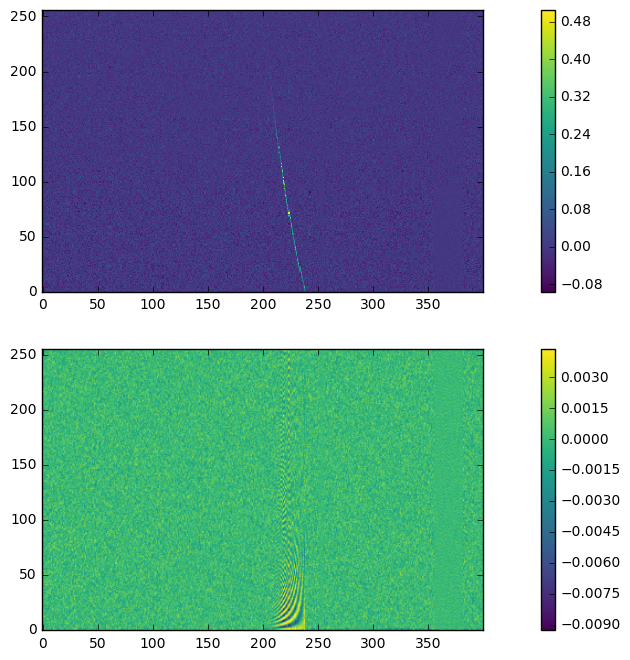

In [13]:
mp3name = '57643.mp3'
writesound(sgram, mp3name, show=True)
Audio(mp3name)

## 57645

In [14]:
# bdf_dedisperse_cut.py -i 16:7126:800 -d 0. -e cut 16A-496_sb32698778_1_02h00m.57645.38915079861
sgram = getsgram('16A-496_sb32698778_1_02h00m.57645.38915079861.ddcut',
                 '16A-496_sb32698778_1_02h00m.57645.38915079861.cut', 16, 
                 '16A-496_sb32698778_1_02h00m.57645.38915079861.GN', [1,2,3], npix_max=4096, chans=range(5,256))

2016-10-04 15:20:52,351 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:20:52,351 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-496_sb32698778_1_02h00m.57645.38915079861.GN
2016-10-04 15:20:52,352 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:20:52,352 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:20:52,353 - rtpipe.parsesdm - INFO - Setting (standard) key chans to [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 1

Gridded 0.979 of data. Scaling fft by = 97.3
Pixel sizes (1.0", 1.0"), Field size 1964.4"


2016-10-04 15:21:12,051 - rtpipe - INFO - Made image with SNR min, max: -5.1, 11.7
2016-10-04 15:21:12,132 - rtpipe - INFO - Rephasing data to (l, m)=(-0.0004, 0.0005).
2016-10-04 15:21:12,234 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:21:12,234 - rtpipe.parsesdm - INFO - Setting (standard) key timesub to mean
2016-10-04 15:21:12,235 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-496_sb32698778_1_02h00m.57645.38915079861.GN
2016-10-04 15:21:12,236 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:21:12,236 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:21:12,237 - rtpipe.parsesdm - INFO - Setting (standard) key chans to [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70

Original sound min/max: -0.00342585390073/0.00367412164755
Rescaled sound min/max: -32767/29748


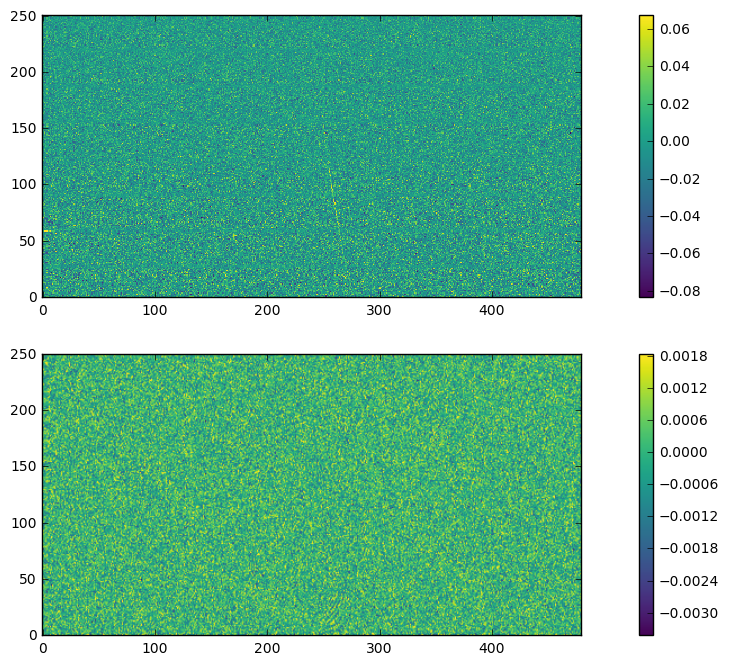

In [15]:
mp3name = '57645.mp3'
writesound(sgram, mp3name, show=True)
Audio(mp3name)

## 57646

In [16]:
# bdf_dedisperse_cut.py -i 32:7162:800 -d 0.0 -e cut 16A-496_sb32698778_1_02h00m_000.57646.38643644676
sgram = getsgram('16A-496_sb32698778_1_02h00m_000.57646.38643644676.ddcut',
                 '16A-496_sb32698778_1_02h00m_000.57646.38643644676.cut', 32, 
                 '16A-496_sb32698778_1_02h00m_000.57646.38643644676.GN', [1,2], npix_max=4096)

2016-10-04 15:21:45,825 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:21:45,826 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-496_sb32698778_1_02h00m_000.57646.38643644676.GN
2016-10-04 15:21:45,827 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:21:45,827 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:21:45,828 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to []
2016-10-04 15:21:45,828 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-04 15:21:45,829 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-04 15:21:45,829 - rtpipe.parsesdm - INFO - Setting (standard) key uvoversample to 1.5
2016-10-04 15:21:45,979 - rtpipe.parsesdm - WARNING - No BDF found for scans [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33]
2016-10-04 15:21:46,418 - rtpipe

Gridded 0.960 of data. Scaling fft by = 103.9
Pixel sizes (1.0", 1.0"), Field size 1983.3"


2016-10-04 15:22:06,199 - rtpipe - INFO - Made image with SNR min, max: -5.3, 17.1
2016-10-04 15:22:06,272 - rtpipe - INFO - Rephasing data to (l, m)=(-0.0004, 0.0005).
2016-10-04 15:22:06,363 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:22:06,364 - rtpipe.parsesdm - INFO - Setting (standard) key timesub to mean
2016-10-04 15:22:06,365 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-496_sb32698778_1_02h00m_000.57646.38643644676.GN
2016-10-04 15:22:06,365 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:22:06,366 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:22:06,366 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to [('badap', 3.0, 0.2)]
2016-10-04 15:22:06,367 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-04 15:22:06,368 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-04 15:22:06,368 - rtpipe.parsesdm - I

Original sound min/max: -0.00390586310447/0.00387797959625
Rescaled sound min/max: -32767/32553


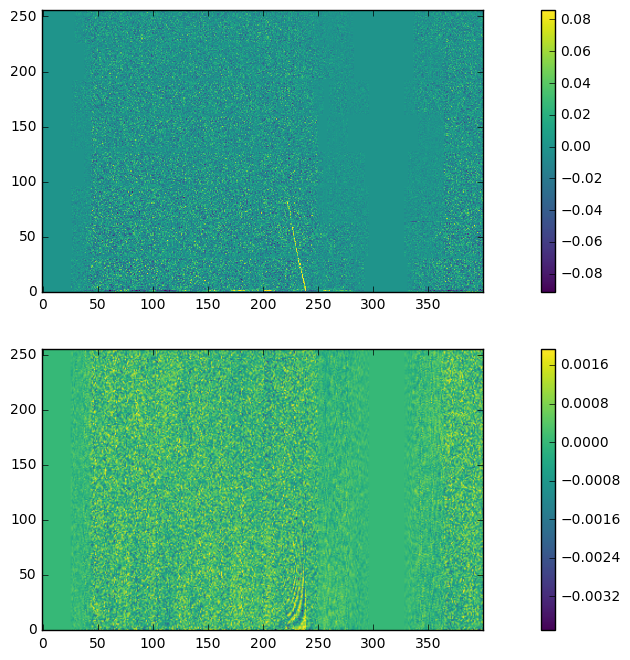

In [17]:
mp3name = '57646.mp3'
writesound(sgram, mp3name, show=True)
Audio(mp3name)

## 57648

In [18]:
# bdf_dedisperse_cut.py -i 25:3479:800 -d 0.0 -e cut 16A-496_sb32698778_1_02h00m_000.57648.37452900463
sgram = getsgram('16A-496_sb32698778_1_02h00m_000.57648.37452900463.ddcut',
                 '16A-496_sb32698778_1_02h00m_000.57648.37452900463.cut', 25, 
                 '16A-496_sb32698778_1_02h00m_000.57648.37452900463.GN', [1,2], npix_max=4096)

2016-10-04 15:22:34,291 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:22:34,292 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-496_sb32698778_1_02h00m_000.57648.37452900463.GN
2016-10-04 15:22:34,292 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:22:34,293 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:22:34,293 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to []
2016-10-04 15:22:34,294 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-04 15:22:34,295 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-04 15:22:34,295 - rtpipe.parsesdm - INFO - Setting (standard) key uvoversample to 1.5
2016-10-04 15:22:34,451 - rtpipe.parsesdm - WARNING - No BDF found for scans [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33]
2016-10-04 15:22:34,881 - rtpipe

Gridded 0.970 of data. Scaling fft by = 96.2
Pixel sizes (1.0", 1.0"), Field size 1983.3"


2016-10-04 15:22:54,465 - rtpipe - INFO - Made image with SNR min, max: -5.4, 20.6
2016-10-04 15:22:54,539 - rtpipe - INFO - Rephasing data to (l, m)=(-0.0004, 0.0005).
2016-10-04 15:22:54,627 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:22:54,627 - rtpipe.parsesdm - INFO - Setting (standard) key timesub to mean
2016-10-04 15:22:54,628 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-496_sb32698778_1_02h00m_000.57648.37452900463.GN
2016-10-04 15:22:54,629 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:22:54,630 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:22:54,630 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to [('badap', 3.0, 0.2)]
2016-10-04 15:22:54,631 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-04 15:22:54,631 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-04 15:22:54,632 - rtpipe.parsesdm - I

Original sound min/max: -0.00329947429156/0.0033756611663
Rescaled sound min/max: -32767/30894


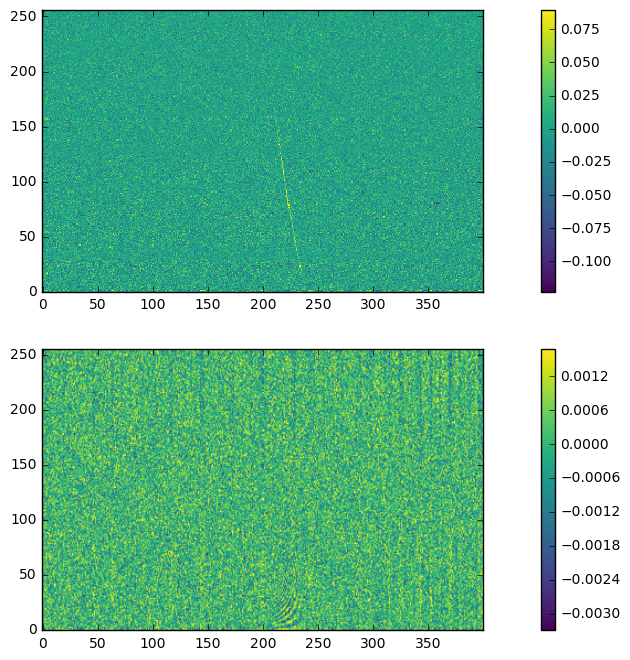

In [19]:
mp3name = '57648.mp3'
writesound(sgram, mp3name, show=True)
Audio(mp3name)

## 57649

In [20]:
# bdf_dedisperse_cut.py -i 31:10200:800 -d 0.0 -e cut 16A-496_sb32698778_1_02h00m_001.57649.37461215278
sgram = getsgram('16A-496_sb32698778_1_02h00m_001.57649.37461215278.ddcut',
                 '16A-496_sb32698778_1_02h00m_001.57649.37461215278.cut', 31, 
                 '16A-496_sb32698778_1_02h00m_001.57649.37461215278.GN', [1,2], npix_max=4096)

2016-10-04 15:23:23,821 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:23:23,822 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-496_sb32698778_1_02h00m_001.57649.37461215278.GN
2016-10-04 15:23:23,822 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:23:23,823 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:23:23,823 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to []
2016-10-04 15:23:23,824 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-04 15:23:23,824 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-04 15:23:23,825 - rtpipe.parsesdm - INFO - Setting (standard) key uvoversample to 1.5
2016-10-04 15:23:23,979 - rtpipe.parsesdm - WARNING - No BDF found for scans [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 32, 33]
2016-10-04 15:23:24,404 - rtpipe

Gridded 0.962 of data. Scaling fft by = 104.8
Pixel sizes (1.0", 1.0"), Field size 1983.3"


2016-10-04 15:23:43,957 - rtpipe - INFO - Made image with SNR min, max: -5.9, 30.2
2016-10-04 15:23:44,030 - rtpipe - INFO - Rephasing data to (l, m)=(-0.0004, 0.0005).
2016-10-04 15:23:44,117 - rtpipe.parsesdm - INFO - Setting (standard) key logfile to False
2016-10-04 15:23:44,118 - rtpipe.parsesdm - INFO - Setting (standard) key timesub to mean
2016-10-04 15:23:44,119 - rtpipe.parsesdm - INFO - Setting (standard) key gainfile to 16A-496_sb32698778_1_02h00m_001.57649.37461215278.GN
2016-10-04 15:23:44,119 - rtpipe.parsesdm - INFO - Setting (standard) key dmarr to [0]
2016-10-04 15:23:44,120 - rtpipe.parsesdm - INFO - Setting (standard) key dtarr to [1]
2016-10-04 15:23:44,121 - rtpipe.parsesdm - INFO - Setting (standard) key flaglist to [('badap', 3.0, 0.2)]
2016-10-04 15:23:44,121 - rtpipe.parsesdm - INFO - Setting (standard) key npix_max to 4096
2016-10-04 15:23:44,122 - rtpipe.parsesdm - INFO - Setting (standard) key flagantsol to True
2016-10-04 15:23:44,122 - rtpipe.parsesdm - I

Original sound min/max: -0.00353066727087/0.00377959633674
Rescaled sound min/max: -32767/32764


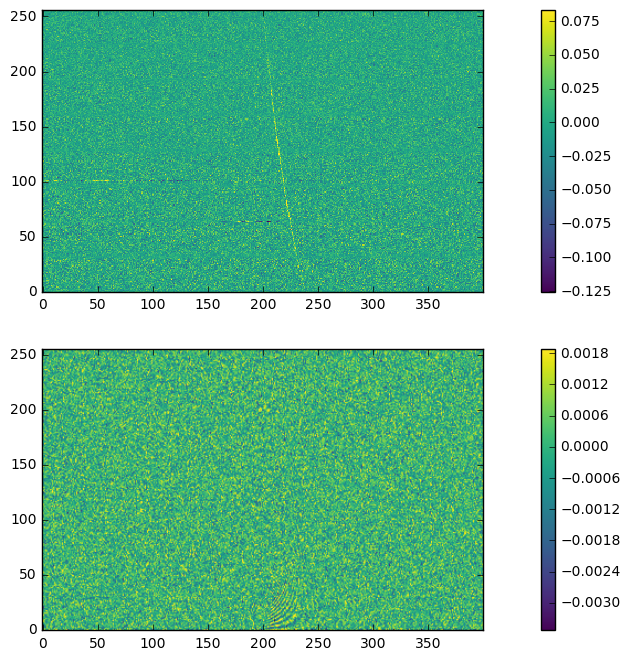

In [21]:
mp3name = '57649.mp3'
writesound(sgram, mp3name, show=True)
Audio(mp3name)